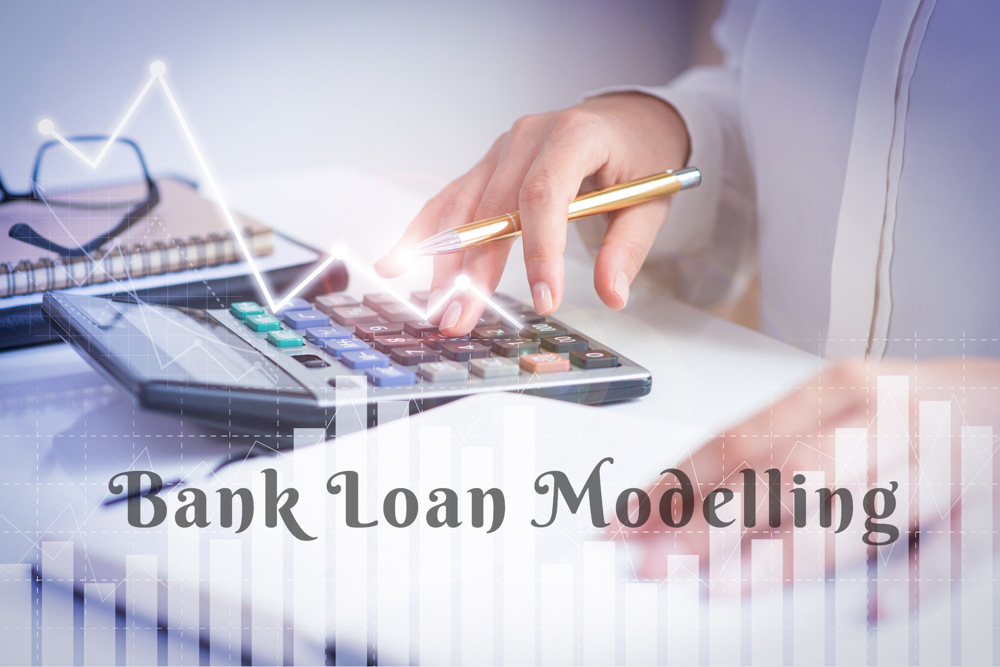

In this project, we will solve a problem for classifying personal loans on the **Thera-Bank dataset**. The majority of Thera-Bank's customers are depositors. The number of customers who are also borrowers (asset customers) is quite small, and the bank is interested in quickly expanding this base to do more loan business while earning more through loan interest. In particular, management wants to look for ways to convert its liability customers into retail loan customers while keeping them as depositors. A campaign the bank ran last year for deposit customers showed a conversion rate of over 9.6% success. This has prompted the retail marketing department to develop campaigns with better target marketing to increase the success rate with a minimal budget. The department would like to develop a classifier that will help them identify the potential customers who are more likely to purchase the loan. This will increase the success rate while reducing the cost of the campaign.

<br>


The dataset contains both customer information and customer response to the last personal loan campaign:

<input type='checkbox'> **ID:** ID of the customer <br>

<input type='checkbox'> **Age:** Age of the customer in completed years<br>

<input type='checkbox'> **Experience:** Amount of work experience in years<br>

<input type='checkbox'> **Income:** Amount of annual income (in thousands)<br>

<input type='checkbox'> **Zipcode:** Postal code in which the client lives<br>

<input type='checkbox'> **Family:** Number of family members<br>

<input type='checkbox'> **CCAvg:** Average monthly spending with the credit card (in thousands)<br>

<input type='checkbox'> **Education:** Education level (1: bachelor's degree, 2: master's degree, 3: advanced/professional degree)<br>

<input type='checkbox'> **Mortgage:** Value of home mortgage, if any (in thousands)<br>

<input type='checkbox'> **Securities Account:** Does the customer have a securities account with the bank?<br>

<input type='checkbox'> **CD Account:** Does the customer have a certificate of deposit account (CD) with the bank?<br>

<input type='checkbox'> **Online:** Does the customer use the internet banking facilities?<br>

<input type='checkbox'> **CreditCard:** Does the customer use a credit card issued by the bank?<br>

<input type='checkbox'> **Personal Loan:** Did this customer accept the personal loan offered in the last campaign? **(Target Variable)**<br>

<br>

**Objective:** To use different classification models to predict the likelihood that a customer will buy a personal loan.

**Let's get started:**

<div style="background-color: #00008B; padding: 10px; text-align: center; border-radius: 30px; height: 70px;">
    <h2 style="color:white;">1. Importing Useful Libraries</h2>
</div>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sn
import sklearn
import ydata_profiling as pp
import xgboost
import warnings
warnings.filterwarnings('ignore')

In [2]:
import scipy.stats
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, cross_val_score
from sklearn.base import clone
from sklearn.metrics import f1_score, RocCurveDisplay, classification_report, ConfusionMatrixDisplay,precision_score \
,recall_score
from sklearn.metrics import accuracy_score, roc_auc_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier

In [3]:
%matplotlib inline

<div style="background-color: #00008B; padding: 10px; text-align: center; border-radius: 30px; height: 70px;">
    <h2 style="color:white;">2. Dataset</h2>
</div>

In [4]:
df = pd.read_excel(r'C:\Users\priya\Desktop\datasets\Bank_Personal_Loan_Modelling.xlsx',sheet_name='Data')

In [5]:
det_df= pd.read_excel(r'C:\Users\priya\Desktop\datasets\Bank_Personal_Loan_Modelling.xlsx',sheet_name='Description')

In [6]:
det_df

,Unnamed: 0,Unnamed: 1,Unnamed: 2
0,NaN,NaN,NaN
1,NaN,NaN,NaN
2,NaN,NaN,NaN
3,NaN,NaN,NaN
4,NaN,Data Description:,NaN
5,NaN,NaN,NaN
6,NaN,ID,Customer ID
7,NaN,Age,Customer's age in completed years
8,NaN,Experience,#years of professional experience
9,NaN,Income,Annual income of the customer ($000)


- CCAVG is on monthly basis while income is on annual basis, so we have to convert ccavg into annual basis also.

In [7]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,5000.0,2500.500000,1443.520003,1.0,1250.75,2500.5,3750.25,5000.0
Age,5000.0,45.338400,11.463166,23.0,35.00,45.0,55.00,67.0
Experience,5000.0,20.104600,11.467954,-3.0,10.00,20.0,30.00,43.0
Income,5000.0,73.774200,46.033729,8.0,39.00,64.0,98.00,224.0
ZIP Code,5000.0,93152.503000,2121.852197,9307.0,91911.00,93437.0,94608.00,96651.0
Family,5000.0,2.396400,1.147663,1.0,1.00,2.0,3.00,4.0
CCAvg,5000.0,1.937913,1.747666,0.0,0.70,1.5,2.50,10.0
Education,5000.0,1.881000,0.839869,1.0,1.00,2.0,3.00,3.0
Mortgage,5000.0,56.498800,101.713802,0.0,0.00,0.0,101.00,635.0
Personal Loan,5000.0,0.096000,0.294621,0.0,0.00,0.0,0.00,1.0


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   ID                  5000 non-null   int64  
 1   Age                 5000 non-null   int64  
 2   Experience          5000 non-null   int64  
 3   Income              5000 non-null   int64  
 4   ZIP Code            5000 non-null   int64  
 5   Family              5000 non-null   int64  
 6   CCAvg               5000 non-null   float64
 7   Education           5000 non-null   int64  
 8   Mortgage            5000 non-null   int64  
 9   Personal Loan       5000 non-null   int64  
 10  Securities Account  5000 non-null   int64  
 11  CD Account          5000 non-null   int64  
 12  Online              5000 non-null   int64  
 13  CreditCard          5000 non-null   int64  
dtypes: float64(1), int64(13)
memory usage: 547.0 KB


In [9]:
df["Personal Loan"].value_counts()

0    4520
1     480
Name: Personal Loan, dtype: int64

In [10]:
df.head(3)

,ID,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
0,1,25,1,49,91107,4,1.6,1,0,0,1,0,0,0
1,2,45,19,34,90089,3,1.5,1,0,0,1,0,0,0
2,3,39,15,11,94720,1,1.0,1,0,0,0,0,0,0


In [11]:
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<div style="background-color: #00008B; padding: 10px; text-align: center; border-radius: 30px; height: 70px;">
    <h2 style="color:white;">3. Data Analysis from Profile Report Summary</h2>
</div>

#### <font color=blue>General details</font>
-   1.This dataset has <b>5000 rows.</b>
-   2.This dataset has <b>14 variable</b>, 13 are independent and 1 is dependent which is personal loan.
-   3.Dataset has<b> 6 numeric variables</b> namely ID , age, experience, salary ,ccavg and mortgage.
-   4.Dataset has<b> 5 boolean variables</b> namely CreditCard,personal loan,online,CD account & securities account
-   5.Dataset has<b> 3 categorical features</b> namely Family,education,Zip code

#### <font color=blue>Other details </font>
-   1.There is no <b>missing Value</b> in the dataset
-   2.There are <b> no duplicates </b> in the dataset
-   3.The dataset contains <b>negative value in experience column</b> which is unreasonable.
-   4.In ZipCode columns <b>1 code has 4 digits only so it is the outlier.</b> That code is 9307.

<div style="background-color: #00008B; padding: 10px; text-align: center; border-radius: 30px; height: 70px;">
    <h2 style = "color:white;">4. Feature analysis</h2>
</div>

#### <font color=Blue>Categorical Features </font>
1. <b> Family:</b> Around 29% customer family size is 1, 26% is 2, 20% is 3 and 24% is 4
2. <b> Education:</b> Around 42% Customer are undergrad ,28% graduate and 30% are having advanced or professional degree.

#### <font color=blue> Numerical Features </font>
1. <b>ID:</b> This column is uniformly distributed and lacks the necessary information for model building.
2. <b>AGE:</b> The mean is around 45 and std is 11.45
3. <b>CCAVG:</b> The mean is 1.93 with std is 1.74 and the curve is fairly right skewed.
4. <b>Income:</b> The mean is 73.44 with std 46.33 and curve is moderately positive skewed.
5. <b>Mortgage:</b> The mean is 56.49 with std 101.71 and curve is highly postive skewed and there are a lot of outliers.

In [12]:
# Id column is of no use for us, hence removing it
df.drop("ID",axis=1,inplace=True)

<div style="background-color: #00008B; padding: 10px; text-align: center; border-radius: 30px; height: 70px;">
    <h2 style="color:white;">5. Correlation analysis</h2>
</div>

-  spearman vs pearson correlation
-  pearson works with linear relationship between variables
-  Spearman works with monotonic relationship 
-  when the variables have "might be linear or might be monotonic".Best bet is to use <b>spearman</b> rather than pearson. 

#### Correlation analysis

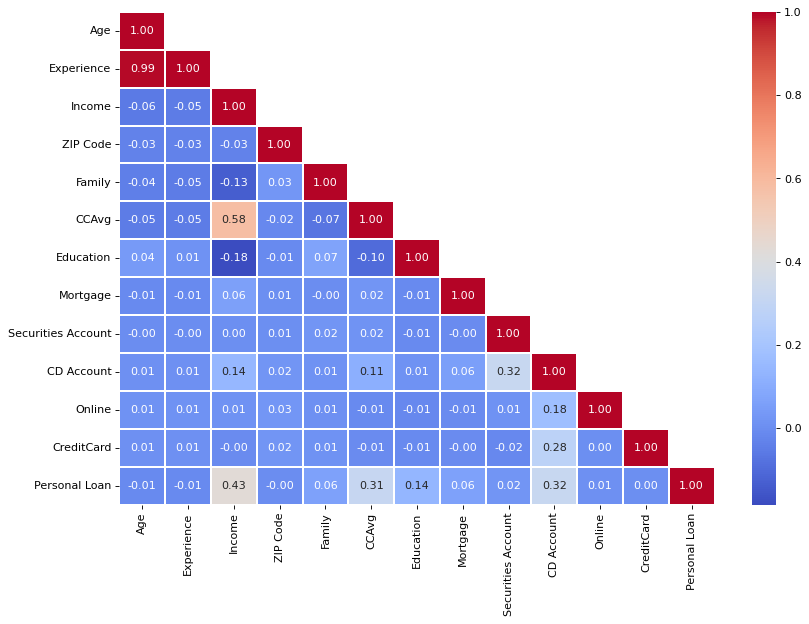

In [13]:
target = 'Personal Loan'

# Calcualation of spearman correlaionship

df_ordered = pd.concat([df.drop(target, axis=1),df[target]],axis=1)
corr= df_ordered.corr(method='spearman') # will give the correlaion matrix
 
#creating a mask so that we can see the correlaion value only once

mask=np.zeros_like(corr)                # will create a 0 matrix like corr
mask[np.triu_indices_from(mask,1)]=True # will fill the upper triangle of matrix with 1

# Plot the heatmap correlation

plt.figure(figsize=(12,8),dpi=80)
sn.heatmap(corr,mask=mask,annot=True,cmap='coolwarm',fmt=".2f",linewidth =0.2)
plt.show()

### <font color='blue'>Conclusion </font>
1. <b>Income is directly correlated with Personal loan</b>
2. <b>experience is highly correlated with age</b>
3. <b>CCavg is highly correlated with income</b>

<div style="background-color: #00008B; padding: 10px; text-align: center; border-radius: 30px; height: 70px;">
    <h2 style="color:white;">6. Noise treatment</h2>
</div>

-  Noise treatment is the process of removing the irrelevant and noisy section of dataset .
-  This process is done before analysis

<b> 1. <font color='blue'>ZIP Code Noise treatment </font></b> 
#### In ZIP code section, one value has code of 4 digits only, hence we have to remove it

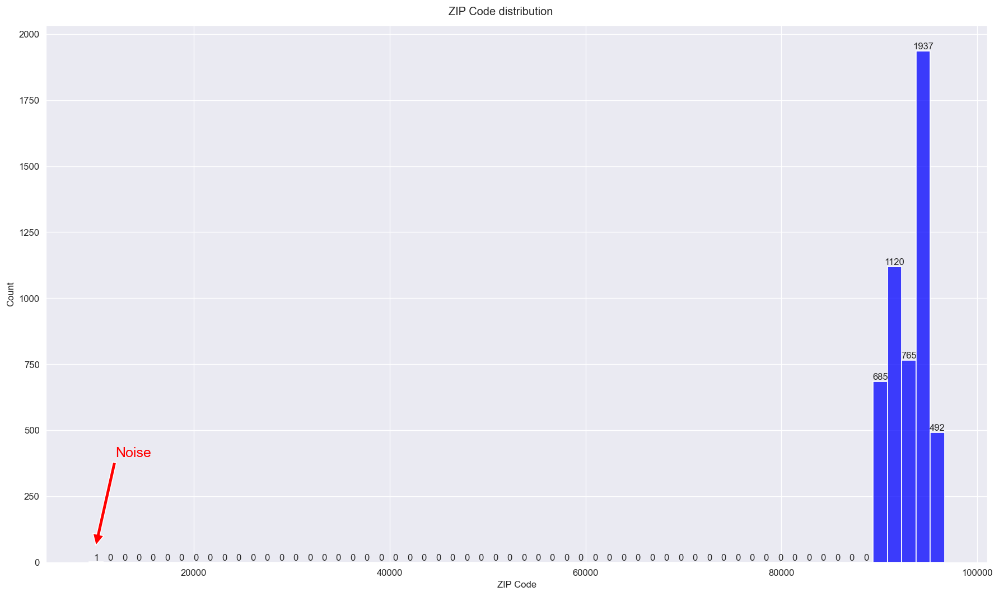

In [14]:
# setting the dark background
sn.set_style('darkgrid')

# plot the histogram
plt.figure(figsize=(15,9),dpi=120)
graph=sn.histplot(x="ZIP Code",data=df,bins=60,color='Blue',stat='count')

plt.xlabel("ZIP Code")
plt.ylabel('Count')
plt.suptitle('ZIP Code distribution')


# for labelling the data bars
for bar in graph.patches:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval),
             ha='center', va='bottom')
    
# for annotation of noise
plt.annotate('Noise', xy=(10000,60), xytext=(12000,400), color="Red", fontsize=15, 
             arrowprops=dict(facecolor='Red', shrink=0.01))
plt.tight_layout()
plt.show()

In [15]:
df[df['ZIP Code'] < 20000]

,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
384,51,25,21,9307,4,0.6,3,0,0,0,0,1,1


In [16]:
# dropping the noise 

df.drop(df[df['ZIP Code']<20000].index,inplace=True)

In [17]:
df.reset_index(drop=True,inplace=True)

In [18]:
df

,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
0,25,1,49,91107,4,1.6,1,0,0,1,0,0,0
1,45,19,34,90089,3,1.5,1,0,0,1,0,0,0
2,39,15,11,94720,1,1.0,1,0,0,0,0,0,0
3,35,9,100,94112,1,2.7,2,0,0,0,0,0,0
4,35,8,45,91330,4,1.0,2,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4994,29,3,40,92697,1,1.9,3,0,0,0,0,1,0
4995,30,4,15,92037,4,0.4,1,85,0,0,0,1,0
4996,63,39,24,93023,2,0.3,3,0,0,0,0,0,0
4997,65,40,49,90034,3,0.5,2,0,0,0,0,1,0


<b>2. <font color='Blue'> Experience noise tretment </font></b>

- Negative value in experience section

In [19]:
df[df["Experience"]<0]['Experience'].count()

52

In [20]:
df[df["Experience"]<0]['Experience'].value_counts()

-1    33
-2    15
-3     4
Name: Experience, dtype: int64

- Total 52 values in experience column  has 52 -ve values 
- considering that it has been done by mistake
- so converting them in their absolute value

In [21]:
#  applying the absolute value to the negative values in the experience section
df[df["Experience"]<0].apply(abs)

,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
89,25,1,113,94303,4,2.300000,3,0,0,0,0,0,1
226,24,1,39,94085,2,1.700000,2,0,0,0,0,0,0
315,24,2,51,90630,3,0.300000,3,0,0,0,0,1,0
450,28,2,48,94132,2,1.750000,3,89,0,0,0,1,0
523,24,1,75,93014,4,0.200000,1,0,0,0,0,1,0
535,25,1,43,92173,3,2.400000,2,176,0,0,0,1,0
539,25,1,109,94010,4,2.300000,3,314,0,0,0,1,0
575,25,1,48,92870,3,0.300000,3,0,0,0,0,0,1
582,24,1,38,95045,2,1.700000,2,0,0,0,0,1,0
596,24,2,125,92835,2,7.200000,1,0,0,1,0,0,1


<div style="background-color: #00008B; padding: 10px; text-align: center; border-radius: 30px; height: 70px;">
    <h2 style="color: white;">7. Outlier Treatment</h2>
</div>
 
- <b>Outliers:</b> The value which are considerably higher than the maximum value or lower than the minimum value.
- In feature analysis section, we have mortgage column having kurtosis 4.75 and skewness 2.05.
- Which shows that data is more positively skewed and has a lot of ouliers in maximum side
- We have used Z score method for outlier tretment 
- for z score calculation, we have 2 methods **1)using scipy.stats  2)calculation by using formula**


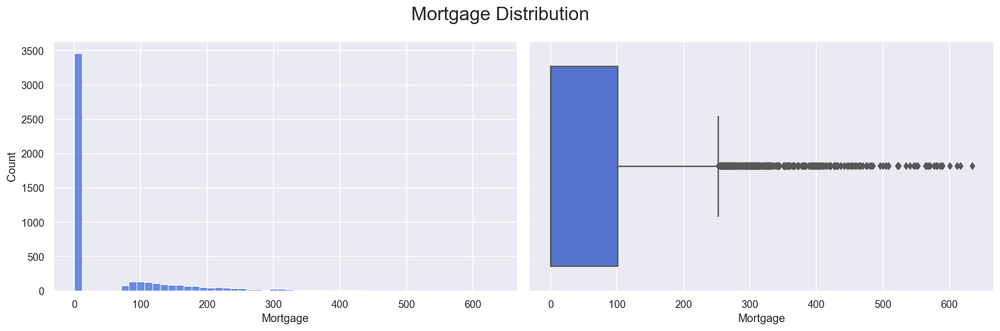

In [22]:
sn.set(rc={'axes.labelsize':15})
fig,axes = plt.subplots(1,2,figsize=(15,5),dpi =120)

sn.histplot(x="Mortgage",data=df,color="#4169E1",ax=axes[0])
sn.boxplot(x='Mortgage',data=df,color='#4169E1',ax=axes[1])

plt.suptitle('Mortgage Distribution',fontsize=20)
plt.tight_layout()
plt.show()

- 2nd Method:Z score <b> calculation using formula</b>

In [23]:
# calculation of mean and std for mortgage 
print(df["Mortgage"].mean())
print(df["Mortgage"].std())

56.510102020404084
101.72083709569985


In [24]:
# Calculation of boundary condition
# ul = mean + 3std
# ll= mean - 3 std

ul = df["Mortgage"].mean() + 3*(df['Mortgage'].std())
ll= df["Mortgage"].mean() - 3*(df["Mortgage"].std())

ul,ll

(361.67261330750364, -248.65240926669549)

In [25]:
# Detection of outliers
# as box plot suggest that it is on maximum side.

df[(df['Mortgage']>ul) | (df["Mortgage"]< ll)] # we have both ul and ll side 

,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
42,32,7,132,90019,4,1.1,2,412,1,0,0,1,0
59,31,5,188,91320,2,4.5,1,455,0,0,0,0,0
119,32,7,112,94304,1,4.6,1,366,0,0,0,0,0
288,44,19,172,94306,2,4.3,3,391,1,1,1,1,0
303,49,25,195,95605,4,3.0,1,617,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4671,52,26,180,95831,1,1.7,1,550,0,0,0,1,0
4697,48,22,162,94143,3,1.4,1,400,1,0,0,0,0
4811,29,4,184,92126,4,2.2,3,612,1,0,0,1,0
4841,49,23,174,95449,3,4.6,2,590,1,0,0,0,0


- 1st Method:<b> USing Scipy.stats</b>

In [26]:
df[scipy.stats.zscore(df["Mortgage"])>3]

,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
42,32,7,132,90019,4,1.1,2,412,1,0,0,1,0
59,31,5,188,91320,2,4.5,1,455,0,0,0,0,0
119,32,7,112,94304,1,4.6,1,366,0,0,0,0,0
288,44,19,172,94306,2,4.3,3,391,1,1,1,1,0
303,49,25,195,95605,4,3.0,1,617,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4671,52,26,180,95831,1,1.7,1,550,0,0,0,1,0
4697,48,22,162,94143,3,1.4,1,400,1,0,0,0,0
4811,29,4,184,92126,4,2.2,3,612,1,0,0,1,0
4841,49,23,174,95449,3,4.6,2,590,1,0,0,0,0


In [27]:
df[scipy.stats.zscore(df["Mortgage"])>3]["Personal Loan"].value_counts()

0    58
1    47
Name: Personal Loan, dtype: int64

- There are 2 method of outlier treatment 1) <b>trimming:</b> removing the outliers 2) <b>capping:</b> making max side outlier to max value
- we are applying <b>trimming </b>method as there are 5000 rows and we are removing 105 rows which is 2 % of total rows

In [28]:
outlier_ind= df[scipy.stats.zscore(df["Mortgage"])>3].index

df.drop(outlier_ind,inplace =True)
df.reset_index(drop=True,inplace =True)

<div style="background-color: #00008B; padding: 10px; text-align: center; border-radius: 30px; height: 70px;">
    <h2 style="color: white;">8. Missing and Duplicates Treatment</h2>
</div>

- Checking for missing value and duplicates value.

In [29]:
df.isnull().sum().sum()

0

In [30]:
df[df.duplicated(keep =False)].sum().sum()

0.0

- It is clear that dataset doesn't have any missing and duplicate value

<div style="background-color: #00008B; padding: 10px; text-align: center; border-radius: 30px; height: 70px;">
    <h2 style="color: white;">9. Feature Transformation</h2>
</div>

- In Dataset CCAvg is **on montly basis while income is on annual basis.**
- In order to have the same unit, we have to transform it on annual basis.


In [31]:
df['CCAvg'] =df["CCAvg"]*12

<div style="background-color: #00008B; padding: 10px; text-align: center; border-radius: 30px; height: 70px;">
    <h2 style="color: white;">10. Bivariate Analysis</h2>
</div>

- Bivariate analysis is a statistical method used to analyze and explore the relationship between variables.
- This indicate how change in one variable is associated with change in another variable.
- First we will identify the relation b/w<b> Categorical column  and  target variable</b> and then b/w <b> numerical column 
  and target variable </b>.


### <font color="#4169E1">1. Categorical Feature Vs Target Variable </font>

- Using 100% stacked barplot

In [32]:
# categorical features
cat_feat = ["Family","Education",'CD Account','Online','Securities Account',"Family"]

Target ="Personal Loan"

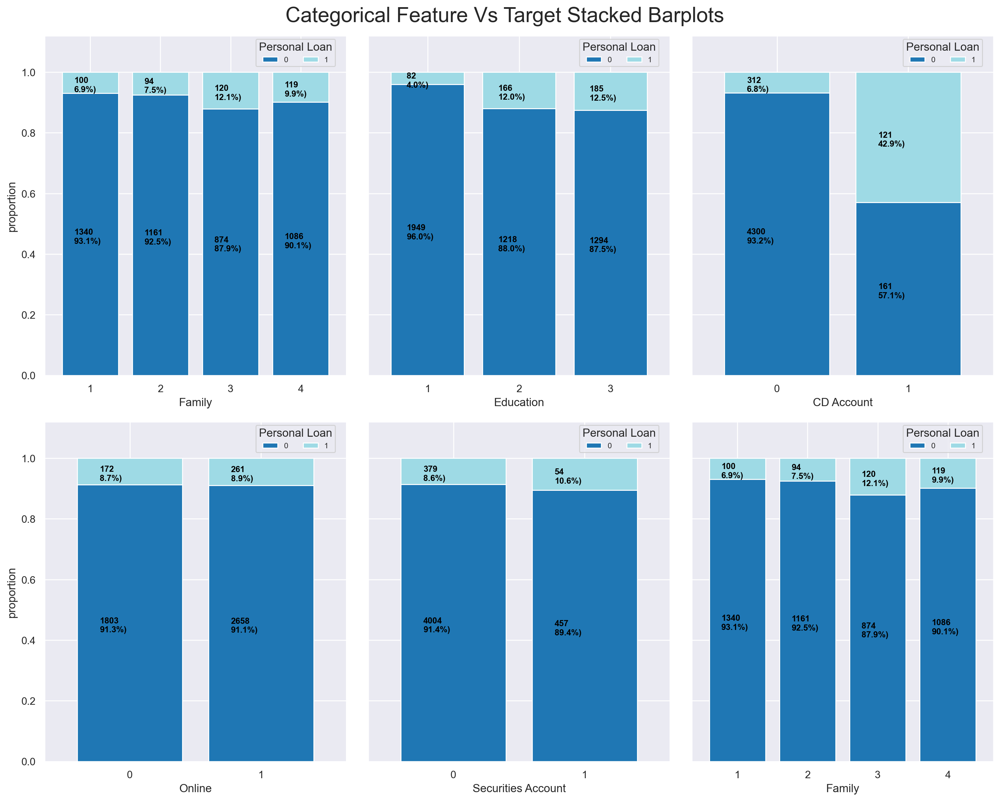

In [33]:
fig,ax = plt.subplots(nrows=2,ncols=3,figsize=(15,12),dpi=200)

for i , col in enumerate(cat_feat):
    
# creating a cross tabulation showing the no. of purchased and non-purchases loans for each category of the feature

    cross_tab = pd.crosstab(index=df[col],columns=df[Target])
    
# using the normalize =True gives the index wise proportion of the data
    
    cross_tab_prop=pd.crosstab(index=df[col],columns = df[Target],normalize="index")

#     colormap
    cmap = "tab20"
    
#     plot stacked bar chart
    x,y = i//3,i%3
    
    cross_tab_prop.plot(kind="bar",ax=ax[x,y],stacked=True,legend =False,width=0.8,colormap=cmap,ylabel="proportion",sharey=True)  

    
# adding proportions and count of individual bars to our plot 

    for idx,val in enumerate([*cross_tab.index.values]):
        for (proportion,count,y_location) in zip(cross_tab_prop.loc[val],cross_tab.loc[val],cross_tab_prop.loc[val].cumsum()):
            ax[x,y].text(x= idx-0.23,y=(y_location-proportion)+(proportion/2)-0.03,s = f'{count}\n{np.round(proportion*100,1)}%)',
                         color='black',fontsize=9,fontweight="bold")
            
# adding legend

            ax[x,y].legend(title="Personal Loan",loc=(0.7,0.91),fontsize=8,ncols=2)
    
# set y limits     

            ax[x,y].set_ylim([0,1.12])
    
# set x ticks and rotations

            ax[x,y].set_xticklabels(ax[x,y].get_xticklabels(), rotation=0)
            
plt.suptitle("Categorical Feature Vs Target Stacked Barplots",fontsize=22)
plt.tight_layout()
plt.show()
    
    
    

<font color="#4169E1"><b> Conclusion</b></font>

1. The Customer who<b> has certificate of deposit (CD) with the bank appears to take personal loan.</b>
2. The Customer having <b>high level of education are more likely to take personal loan.</b>
3. No of family member has no significant effect on the Personal loan modelling.
4. The customer have or not have a securities account does not have any significant effect on personal loan modelling
5. The customer who use or donot use online services does not have any significant effect on personal loan modelling.


### 2.<font color="#4169E1"> Numerical Feature Vs Target Variable </font>

- we will try to find the mean and distribution of numerical features for which customers purchase a personal loan.

In [34]:
Num_feat=['Age','Mortgage',"Income",'CCAvg',"Experience"]

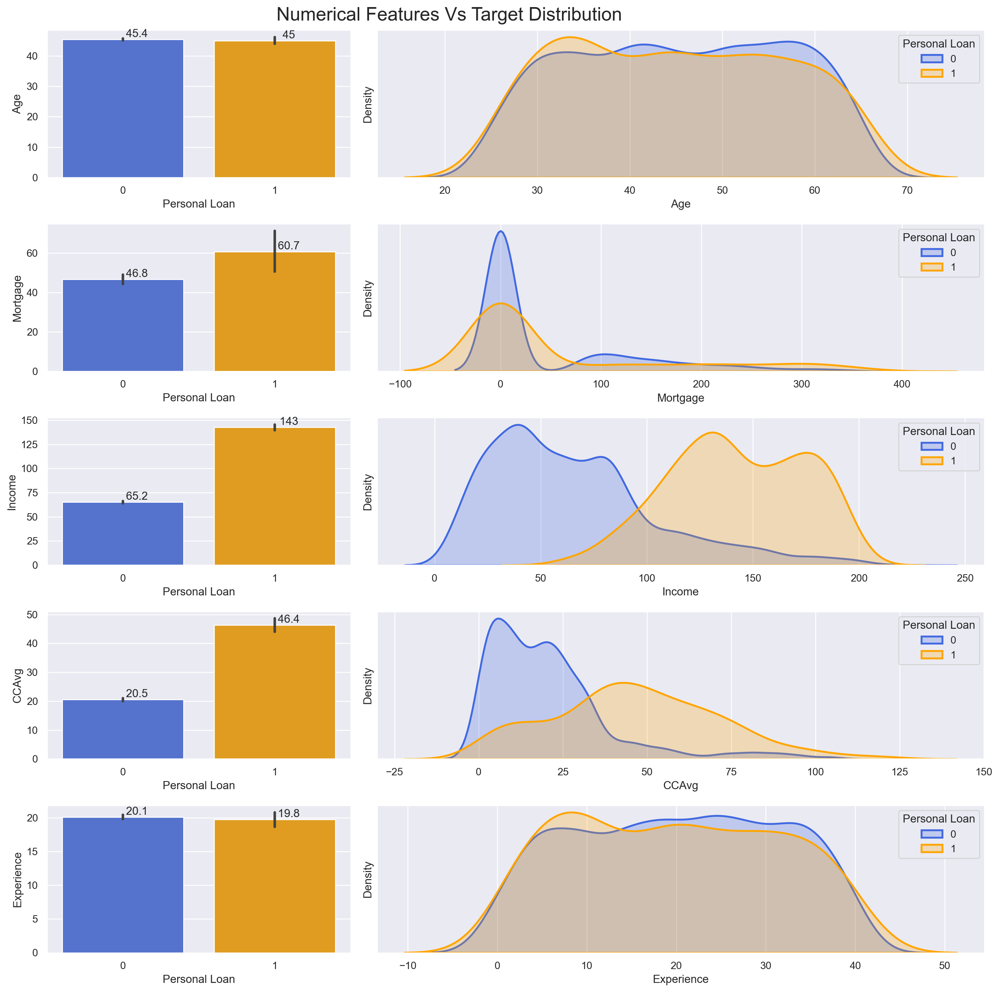

In [35]:
palt= sn.color_palette(["#4169E1", "#FFA500"])
sn.set_palette(palt)
fig,ax=plt.subplots(nrows=5,ncols=2,figsize=(15,15),dpi=200,gridspec_kw={'width_ratios':[1,2]})

# drawing the plots

for i, col in enumerate(Num_feat):
    
    graph=sn.barplot(data=df,x=Target,y=col,ax=ax[i,0])
    sn.kdeplot(data=df[df[Target]==0],x=col,fill=True,linewidth=2,ax=ax[i,1],label="0")
    sn.kdeplot(data=df[df[Target]==1],x=col,fill = True,linewidth=2,ax=ax[i,1],label='1')
    
# removing the y ticks in density plot
    ax[i,1].set_yticks([])
    ax[i,1].legend(title="Personal Loan",loc="upper right")
    
#  labelling the graph
    for cont in graph.containers:
        graph.bar_label(cont,fmt="         %.3g")
        
plt.suptitle('Numerical Features Vs Target Distribution',x=0.45,fontsize=20)
plt.tight_layout()
plt.show()

<font color="#4169E1"><b> Conclusion</b></font>

1. The Customers <b> having high income has high probability of taking the personal loan.</b>
2. The Customer who <b>spends more on credit card are more likely to take personal loan.</b>
3. Customer having high mortgage value are more likely to take the personal loan.
4. Age of Customer has no effect on probablity of taking the personal loan.
5. like age, Experience of customer has no effect on probability of taking the personal loan.
6. <b>Age and experiece has similar effect. Hence, we are removing the experience column.</b>

<div style="background-color: #00008B; padding: 10px; text-align: center; border-radius: 30px; height: 70px;">
    <h2 style="color: white;">11. Train Test Split</h2>
</div>

- we will divide the data into training set and testing set.
- X is a dataset containing all the features except target.
- Y is dataset containing the target feature.

In [36]:
X=df.drop(["Personal Loan"],axis =1)
Y= df["Personal Loan"]

In [37]:
df["Personal Loan"].value_counts(normalize=True)

0    0.911524
1    0.088476
Name: Personal Loan, dtype: float64

In [38]:
df["Personal Loan"].value_counts(normalize=True).mul(100)

0    91.152432
1     8.847568
Name: Personal Loan, dtype: float64

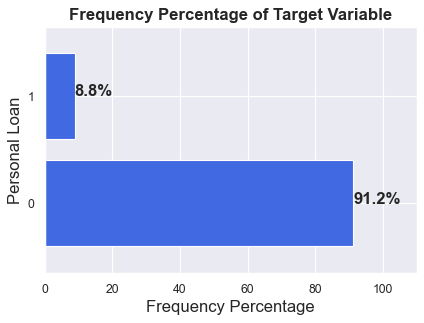

In [39]:
plt.figure(dpi=80)

# doing normalize to get the value in percentage
df["Personal Loan"].value_counts(normalize=True).mul(100).plot(kind="barh",figsize=(6,4),width=0.8)

label = df["Personal Loan"].value_counts(normalize=True).mul(100).round(1)

# labelling the data
for i in label.index:
    plt.text(label[i],i,str(label[i])+"%",fontsize=15,weight="bold")
    
      
# setting the xlimit to 110% for better visulization

plt.xlim([0,110])
plt.xlabel("Frequency Percentage",fontsize=15,)
plt.ylabel("Personal Loan",fontsize=15,)
plt.title("Frequency Percentage of Target Variable",fontsize=15,weight="bold")
plt.show()

## <font color="#4169E1"><b> Conclusion</b></font>

1. Only 8.8% people is taking the personal loan, hence <b> the dataset is imbalanced.</b>
2. Imbalanced Dataset: A dataset having unequal no.of sample from each target class.
3. Here, for class 1,only 8.8% and for 0 , 91.2%

<b> 1. Problem with imbalanced dataset</b>

1. Algorithm may be biased towards majority class and thus tend to predict output as per the majority class.
2. Minority class look like noise to the model and may be ignored by model.
3. Imbalanced dataset can have misleading accuracy score.

- for eg: Our dataset has 91.2% class 0 and only 8.8% class 1, then learning model could be easily optimized to just predict  
  all the all test input as belonging to class 0 and still get 91.2% accuaracy.
  
<b> 2. Techniques to handle imbalanced dataset</b>

1. The approach to train test split when dealing with imbalanced dataset is to use <b>Stratification </b>
2. <b>Stratification: </b>It ensures that proportion of each class remains the same across the both the training and test sets.
3. Stratified sampling also ensures that any trends or correlations among different classes that exist within the overall    dataset are preserved after splitting into training and test datasets


<font color='red'> Let's move for train test split</font>

In [41]:
X_train,X_test,Y_train,Y_test = train_test_split(X,Y,test_size=0.2,random_state=0,stratify=Y)

In [42]:
X_train.shape,Y_train.shape,X_test.shape,Y_test.shape

((3915, 12), (3915,), (979, 12), (979,))

In [42]:
%store X_train
%store X_test
%store Y_train
%store Y_test

Stored 'X_train' (DataFrame)
Stored 'X_test' (DataFrame)
Stored 'Y_train' (Series)
Stored 'Y_test' (Series)


<div style="background-color: red; padding: 10px; text-align: center; border-radius: 10px; height: 70px;">
    <h2 style="color: white;">Storing training and testing set</h2>
</div>


In [43]:
%store -r X_train
X_train.head(2)

,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Securities Account,CD Account,Online,CreditCard
1372,58,28,75,92121,1,16.8,3,0,0,0,1,0
1662,45,21,140,91024,2,91.2,1,132,0,0,0,0


In [44]:
%store -r X_test
X_test.head(2)

,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Securities Account,CD Account,Online,CreditCard
478,42,18,34,92115,4,3.6,1,104,1,0,1,0
1718,50,24,80,95616,4,58.8,1,0,0,0,1,0


In [45]:
%store -r Y_train
Y_train

1372    0
1662    0
4776    0
2791    0
2174    0
       ..
6       0
3075    0
1807    0
1745    0
4125    0
Name: Personal Loan, Length: 3915, dtype: int64

In [46]:
%store -r Y_test
Y_test

478     0
1718    0
671     0
2183    0
2386    0
       ..
735     0
1284    0
1864    0
1538    1
3374    0
Name: Personal Loan, Length: 979, dtype: int64

- Let's see the proportion of 0 and 1 in the dataset

In [47]:
Y.value_counts(normalize=True)

0    0.911524
1    0.088476
Name: Personal Loan, dtype: float64

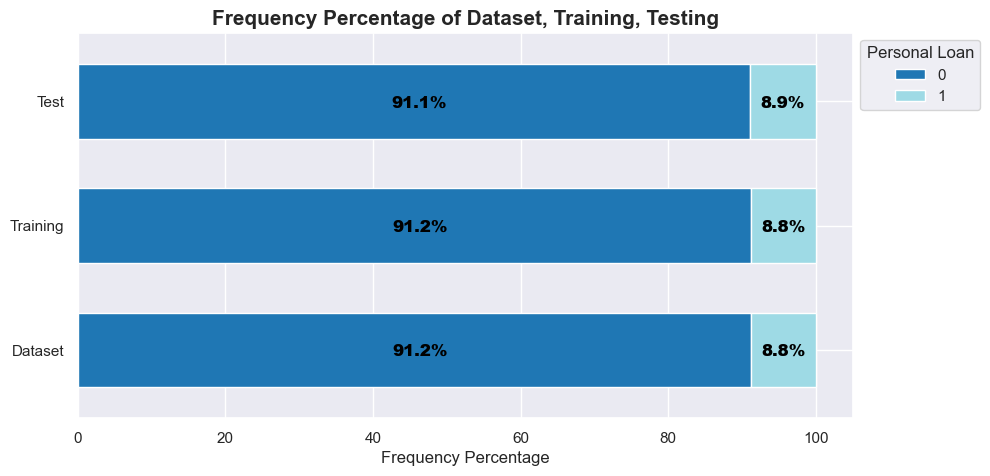

In [48]:
# Define a dataframe containing frequency percentage

df_percen= pd.concat([Y.value_counts(normalize=True).mul(100).round(1),
             Y_train.value_counts(normalize=True).mul(100).round(1),
             Y_test.value_counts(normalize=True).mul(100).round(1)],axis=1)

df_percen.columns=["Dataset","Training","Test"]
df_percen=df_percen.T

df_percen.plot(kind="barh",stacked =True,figsize=(10,5),width=0.6,colormap="tab20")

for idx,val in enumerate([*df_percen.index.values]):
    for (percentage,y_location) in zip(df_percen.loc[val],df_percen.loc[val].cumsum()):
        plt.text(x= (y_location-percentage)+(percentage/2)-3
                 ,
                 y=idx-0.05,
                s=f"{percentage}%",
                color='black',
                fontsize=12,
                weight='black')
plt.legend(title="Personal Loan",loc=(1.01,0.8))
plt.xlabel('Frequency Percentage',fontsize=12)
plt.title('Frequency Percentage of Dataset, Training, Testing',fontsize=15,weight='bold')
plt.show()

<div style="background-color: #00008B; padding: 10px; text-align: center; border-radius: 30px; height: 70px;">
    <h2 style="color: white;">12. Model Buliding
    </h2>
</div>

### <b>1. The Model evaluation approach</b>

 The approach for model when dealing with <b>Imbalanced dataset </b> is to use appropriate metrics including 
 <b>Recall, Precision, F1 Score, AUC ( Area under Curve)</b> that are better suited instead of traditional 
 accuracy metrics which donot take imbalance class into account by default.
 
 In this project, main goal is to predict potential customers who are more likely to purchase a loan. The 
 metrics used to evaluate the performance of model will be important in determining how will the model is 
 able to identify these customers.
 
 - <b>Recall: </b>It is a measure of actual positive cases that were correctly identified by model. A high 
   recall means that the model has a low no of false negatives, which is desirable because it means that 
   model is not missing many potential loan customers.
   
 - <b>Precision: </b>It is the proportion of predicted positive which are truly postive. A highb>precision 
   means the model has low no of false positive, which is desirable which means model is not identifying 
   the many non-loan customers
 - <b>F1 Score: </b>It is  the harmonic mean of precision and recall. A high F1 Score indicates the balance 
   between precision and recall.
   
 - **AUC(Area under Curve):** The AUC metric measures the performance of binary classifier by plotting true 
   positive rate against the false positive rate and calculating the area under curve.



In [49]:
# as we seen F1 score for class 1 should be considered as the most important metric for this project.

def f1_metric(model,X_train,Y_train):
    
# this function returns f1 score metric for the class specified by the positive label(class 1 of personal loan)    

    return f1_score(Y_train,model.predict(X_train),average="binary")

In [50]:
def metrics_calculator(clf, X_test, Y_test, model_name):
    '''
    This function calculates all desired performance metrics for a given model on test data.
    '''
    Y_pred = clf.predict(X_test)
    result = pd.DataFrame(data=[accuracy_score(Y_test, Y_pred),
                                precision_score(Y_test, Y_pred, average='binary'),
                                recall_score(Y_test, Y_pred, average='binary'),
                                f1_score(Y_test, Y_pred, average='binary'),
                                roc_auc_score(Y_test, clf.predict_proba(X_test)[::,1])],
                          index=['Accuracy','Precision','Recall','F1-score','AUC'],
                          columns = [model_name])
    
    result = (result * 100).round(2).astype(str) + '%'                            
    return result


### Cloning

Cloning a model can be useful for creating multiple versions of the same model. This way, different versions of the model can be tested with various parameters or datasets. This can allow for more thorough and accurate evaluation of the model so that one version is not overly biased towards previous versions. Additionally it may be desirable to find out how slightly different parameters affect the performance of a model. Cloning a model allows us to do this quickly and easily by generating multiple models and testing them side-by-side.

Next, we will implement Drop-column Feature Importance Technique through a function using cloning:


In [51]:
def drop_col_importance(model,X_train,Y_train,random_state=0):
    
#  list containing feature importances
    importances=[]
    
# cloning the model    
    model_clone= clone(model)
    
# set random state for comparibility    
    model_clone.random_state=random_state

# Train the model
    model_clone.fit(X_train,Y_train)
    
# create corss validation object using stratifiedkfold
    cv=StratifiedKFold(n_splits=5,shuffle=True,random_state=0)

# score the benchmark model using cross-validation
    benchmark_score=cross_val_score(model_clone,X_train,Y_train,cv=cv,scoring=f1_metric).mean()
    
# Iterate over all feature and store feature importances

    for col in X_train.columns:
        #clone the model
        model_clone = clone(model)
        
        # set random state
        model_clone.random_state= random_state
        
        # Train the model with single feature removed
        model_clone.fit(X_train.drop(col,axis=1),Y_train)
        
        # score the dropped column model
        drop_col_score= cross_val_score(model_clone,X_train.drop(col,axis=1),Y_train,cv=cv,scoring=f1_metric).mean()
        
        # store feature importances which is equal to difference between the benchmark and the new model score
        importances.append(benchmark_score-drop_col_score)
        
    # return the feature along with its importance in the form of a dataframe    
    importances_df= pd.DataFrame({'feature':X_train.columns,'feature_importances':importances})\
    .sort_values('feature_importances',ascending=False,).reset_index(drop=True)
    
    return importances_df

#### Defining a function to visualize the importance of drop column feature using bar chart.

In [52]:
def drop_col_importance_plot(model, X_train,Y_train,):
    
    #call drop col feature importance function
    df_drop_col=drop_col_importance(model,X_train,Y_train,random_state=0)
    
    # Rename COls
    df_drop_col.columns=["Feature","Feature Importance"]
    
    # plot Barchart
    plt.figure(figsize=(12,10))
    sn.barplot(data=df_drop_col,x="Feature Importance",y="Feature",orient="h",color='#4169E1')
    
    plt.title("Drop Column Feature Importance",fontsize = 20)
    plt.show()

<div style="background-color: #00008B; padding: 10px; text-align: center; border-radius: 30px; height: 70px;">
    <h2 style="color: white;">13. Logistic Regression
    </h2>
</div>

<b>Logistic Regression </b>is a supervised learning algorithm used for binary classification problem. It models the 
probability of target variable (usually binary) as a function of input features, using a Logistic(sigmoid) 
function map prediction between 0 and 1. 

### <font color="#4169E1"><b>Step 1 : Scaling data using standard scaler </b></font>

- <b>Benefits of standard scaling </b>on Logistics regression:

1. <b>Gradient Descent Convergence:</b> The optimization algorithm used in the logistic regression is gradient Descent.
   when the features have different scales, the magnitude of gradient will also be different for different features.
   Scaling the features to have the same scale ensures that the magnitude of the gradient is the same for all features, 
   which can lead to faster convergence of optimization algorithm.
   
   
2. <b>Regularization:</b> Logistic regression uses regularization to prevent overfitting. When the features have different 
   scales, the regularization term in the cost function tend to give more weight to the feature with higher values, which 
   can be problemetic in certain cases 
   
   
3. <b>Better Performance:</b> In some cases, scaling the feature can lead to a better performance of the logistic regression
   model, especially when the features have a skewed distribution or are not on the same scale.
   

- we have already splitted training set and testing set 

- <font color='red'> Let's start with scaling </font>

In [53]:
# scaling 
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# converting from ndarray to dataframe
X_train = pd.DataFrame(X_train_scaled,columns=X_train.columns)
X_test = pd.DataFrame(X_test_scaled,columns=X_test.columns)

### <font color="#4169E1">Step 2 : Logistic Regression HyperParemeter tuning </font>

Hyperparameter tuning can affect the performance of a logistic regression model by allowing it to find the <b> best combination of hyperparameters </b>that result in the lowest error on the training set. This can lead to <b>improved prediction performance and reduced overfitting. </b>However, if not done, it can lead to overfitting on the validation set, resulting in a model that is not generalizable to new data.


#### <font color="Blue">Logistic Regression Param </font>

**class sklearn.linear_model.LogisticRegression(penalty='l2', *, dual=False, tol=0.0001, C=1.0, fit_intercept=True, intercept_scaling=1, class_weight=None, random_state=None, solver='lbfgs', max_iter=100, multi_class='auto', verbose=0, warm_start=False, n_jobs=None, l1_ratio=None)**

#### Necessary Parameters 

1. penalty:{‘l1’, ‘l2’, ‘elasticnet’, None}, default=’l2’
   Specify the norm of the penalty:

2. C:float, default=1.0
   Inverse of regularization strength; must be a positive float. Like in support vector machines, smaller values specify 
   stronger regularization
 
3. class_weight : importance of each class 

4. solver:{‘lbfgs’, ‘liblinear’, ‘newton-cg’, ‘newton-cholesky’, ‘sag’, ‘saga’}, default=’lbfgs’

5. l1_ratio:float, default=None


Also, since our dataset is imbalanced, <b>we intend to make the correct classification of the minority class more important than the correct classification of the majority class in the optimization process, which is called penalizing the model.</b> We do this by giving more weight to the minority class. Therefore, the weights of the classes are hyperparameters whose optimal value is also determined during the Hyperparameter tuning process

#### Define the Hyperparameter Grid

Hyperparameter Grid refers to a **pre-defined set of hyperparameters to be tested in a model training process.** Each combination of hyperparameters is a single point in the grid, and the **goal is to select the best hyperparameters for the model by evaluating model performance on a validation set**. The grid defines the search space for hyperparameter optimization algorithms to find the optimal hyperparameters.

1. Each dictionary in the parameter grid specifies a distinct set of hyperparameters to explore.
2. The algorithm will search within each dictionary separately.
3. The best combination of hyperparameters will be selected from each dictionary based on cross-validation performance.
4. The algorithm will then compare the best combinations from each dictionary and select the overall best combination.

- we have used **multiple dictionaries instead of a single dictionary because:**

Multiple dictionaries might be useful when you want to explicitly group different sets of hyperparameters to explore   separately. This can be beneficial when you want to isolate the search for certain parameters or when you want to differentiate between different variations of hyperparameters.

In [50]:
# weight associated with classes
class_weights = [{0:x,1:1.0-x} for x in np.linspace(0.001,0.5,10)]

# Define hyperparameters grid 
param_grid = [{"solver":['lbfgs', 'newton-cg', 'sag', 'saga'] ,"penalty" : [None], 
                         "class_weight":class_weights} , 
                         
             {"solver":['lbfgs', 'newton-cg', 'sag'],"penalty":['l2',],
             "C": np.logspace(-5,5,10),'class_weight':class_weights},
                         
                        {'solver':['liblinear', 'saga'], 
               'penalty': ['l1', 'l2'], 
               'C': np.logspace(-5, 5, 10), 
               'class_weight':class_weights},
                         
                        {'solver':['saga'], 
               'penalty':['elasticnet'], 
               'C': np.logspace(-5, 5, 10),
               'l1_ratio': np.arange(0,1.1,0.1), 
               'class_weight':class_weights}
                        ]

#### Finding Optimal parameters set 

we use gridsearchcv to find the optimal no. of hyperparameters that give the best performance on the training data.
Scoring value chosen is F1_score

- <font color='green'>run this code at starting </font>

In [53]:
def tune_hyperparameter_clf(clf,param_grid,X_train,Y_train):
    
    # creating cross validation obj using stratifieskfold to ensure that the class distribution is same across all the folds
    cv = StratifiedKFold(n_splits=3,shuffle =True, random_state=0)
    
    # create the gridsearchcv object
    clf_grid=GridSearchCV(estimator=clf,param_grid=param_grid,scoring=f1_metric,cv=cv,n_jobs=1)
    
    # training to get the optimum params
    clf_grid.fit(X_train,Y_train)
    
    print("Best Parameters \n",clf_grid.best_params_)
    
    # returning the best estimator 
    return clf_grid.best_estimator_

It uses 
    **GridSearchCV and cross-validation (StratifiedKFold) to evaluate different combinations of hyperparameters**, and selects  
    the combination with the **highest f1-score. The function returns the best classifier with the optimal hyperparameters.**

In [56]:
# applying the base model 

lr = LogisticRegression(max_iter=1000)

lr_opt = tune_hyperparameter_clf(lr,param_grid,X_train,Y_train)

Best Parameters 
 {'C': 3.593813663804626, 'class_weight': {0: 0.44455555555555554, 1: 0.5554444444444444}, 'penalty': 'l2', 'solver': 'liblinear'}


In [57]:
%store lr_opt

Stored 'lr_opt' (LogisticRegression)


In [58]:
%store -r lr_opt
lr_opt

LogisticRegression(C=3.593813663804626,
                   class_weight={0: 0.44455555555555554, 1: 0.5554444444444444},
                   max_iter=1000, solver='liblinear')

In [59]:
importances_col_df= drop_col_importance(lr_opt,X_train,Y_train)
importances_col_df

,feature,feature_importances
0,Income,0.203341
1,Education,0.102956
2,CD Account,0.029090
3,Family,0.017992
4,CreditCard,0.011227
5,Online,0.008967
6,CCAvg,0.003927
7,Experience,-0.000179
8,ZIP Code,-0.000855
9,Securities Account,-0.001184


In [60]:
importances_col_df["feature_importances"]=importances_col_df["feature_importances"]*100

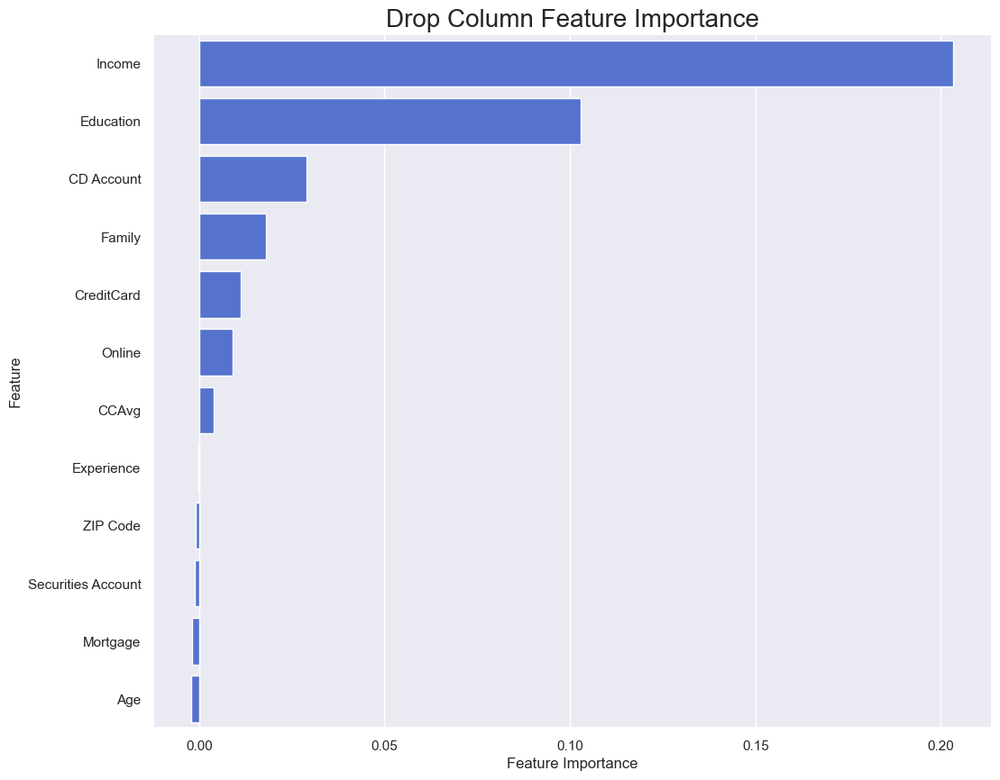

In [61]:
drop_col_importance_plot(lr_opt,X_train,Y_train)

### Conclusion

- Income columns has more importance ,followed by education, credit account and family 
- Age and mortgage show high negative deviation 
- Securities a/c and ZIP code has slight negative deviation
- Experience has no considerable feature importance

In [62]:
importances_col_df.T

,0,1,2,3,4,5,6,7,8,9,10,11
feature,Income,Education,CD Account,Family,CreditCard,Online,CCAvg,Experience,ZIP Code,Securities Account,Mortgage,Age
feature_importances,20.334074,10.295631,2.908978,1.799151,1.122711,0.896716,0.392698,-0.017911,-0.085454,-0.118359,-0.193666,-0.220386


In [66]:
feature_imp_lr = drop_col_importance(lr_opt,X_train,Y_train)
selected_features= feature_imp_lr[feature_imp_lr["feature_importances"]>0]['feature']

X_train_fil = X_train[selected_features]
X_test_fil = X_test[selected_features]

In [67]:
lr1=LogisticRegression(max_iter=1000)
lr1_opt = tune_hyperparameter_clf(lr1,param_grid,X_train_fil,Y_train)

Best Parameters 
 {'class_weight': {0: 0.5, 1: 0.5}, 'penalty': None, 'solver': 'lbfgs'}


In [68]:
%store lr1_opt

Stored 'lr1_opt' (LogisticRegression)


In [69]:
%store -r lr1_opt

In [71]:
lr1_opt

LogisticRegression(class_weight={0: 0.5, 1: 0.5}, max_iter=1000, penalty=None)

In [72]:
importances_col_df1= drop_col_importance(lr1_opt,X_train_fil,Y_train)
importances_col_df1

,feature,feature_importances
0,Income,0.238751
1,Education,0.103292
2,CD Account,0.054317
3,Family,0.028975
4,CreditCard,0.026045
5,CCAvg,0.007881
6,Online,0.002503


### Model evaluation 

- <font color='red'> Run this code at starting

In [54]:
def model_evaluation(clf, X_train, X_test, Y_train, Y_test, model_name):
    '''
    This function provides a complete report of the model's performance including classification reports, 
    confusion matrix and ROC curve.
    '''
    sn.set(font_scale=1.2)
    
    # Generate classification report for training set
    Y_pred_train = clf.predict(X_train)
    print("\n\t  Classification report for training set")
    print("-"*55)
    print(classification_report(Y_train, Y_pred_train))

    # Generate classification report for test set
    Y_pred_test = clf.predict(X_test)
    print("\n\t   Classification report for test set")
    print("-"*55)
    print(classification_report(Y_test, Y_pred_test))
    
    # Create figure and subplots 
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5), dpi=100, gridspec_kw={'width_ratios': [2, 2, 1]})
    
    # Plot confusion matrix for test set
    ConfusionMatrixDisplay.from_estimator(clf, X_test,Y_test, colorbar=False, cmap='Blues', ax=ax1)
    ax1.set_title('Confusion Matrix for Test Data')                                     
    ax1.grid(False)
    
    # Plot ROC curve for test data and display AUC score 
    RocCurveDisplay.from_estimator(clf, X_test, Y_test, ax=ax2)
    ax2.set_xlabel('False Positive Rate')
    ax2.set_ylabel('True Positive Rate')
    ax2.set_title('ROC Curve for Test Data (Positive label: 1)')
    
    # Report results for the class specified by positive label
    result = metrics_calculator(clf, X_test, Y_test, model_name)
    table = ax3.table(cellText=result.values, colLabels=result.columns, rowLabels=result.index, loc='center')
    table.scale(0.6, 2)
    table.set_fontsize(12)
    ax3.axis('tight')
    ax3.axis('off')
    # Modify color 
    for key, cell in table.get_celld().items():
        if key[0] == 0:
            cell.set_color('#4169E1')
    plt.tight_layout()
    plt.show() 


	  Classification report for training set
-------------------------------------------------------
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      3569
           1       0.83      0.63      0.72       346

    accuracy                           0.96      3915
   macro avg       0.90      0.81      0.85      3915
weighted avg       0.95      0.96      0.95      3915


	   Classification report for test set
-------------------------------------------------------
              precision    recall  f1-score   support

           0       0.96      0.98      0.97       892
           1       0.72      0.57      0.64        87

    accuracy                           0.94       979
   macro avg       0.84      0.78      0.80       979
weighted avg       0.94      0.94      0.94       979



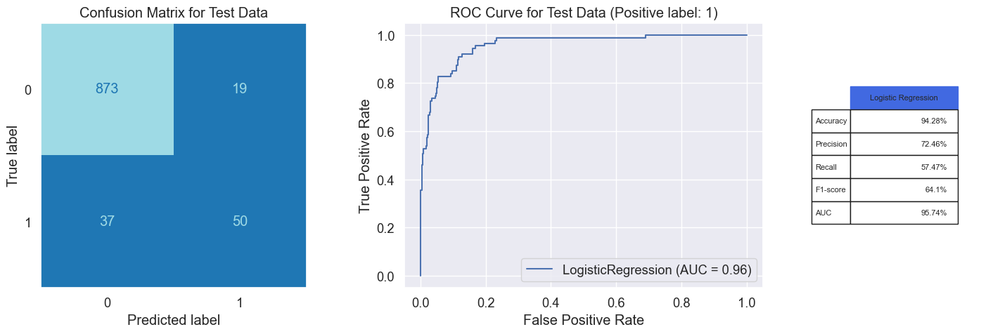

In [73]:
model_evaluation(lr1_opt, X_train_fil, X_test_fil, Y_train, Y_test, 'Logistic Regression')

In [74]:
lr_result=metrics_calculator(lr1_opt,X_test_fil,Y_test,"Logistic Regression")
lr_result

,Logistic Regression
Accuracy,94.28%
Precision,72.46%
Recall,57.47%
F1-score,64.1%
AUC,95.74%


<div style="background-color: #00008B; padding: 10px; text-align: center; border-radius: 30px; height: 70px;">
    <h2 style="color: white;">14. Decision Tree 
    </h2>
</div>

- Decision tree is a **supervised learning technique** that can be used for both classification and regression problems
- It is a **tree based algortihm** which works by recursively splitting the data into subsets based on the value of 
  the features, with the goal of minimizing cost function, such as gini impurity of entropy
  
1. **Root Node:** node from where decision tree starts
2. **Leaf Node:** final output node
3. **Entropy:** Degree of disorderness


#### Advantages 

- **Easy to understand and interpret:** Decision Trees are simple to understand and visualize.

- **Handles both numerical and categorical data:** Decision Trees can handle both numerical and categorical data.

- **Feature selection:** Decision Trees can be used for feature selection, as important features will appear near the root of the tree.

- **Non-parametric:** Decision Trees are non-parametric, meaning that they make no assumptions about the underlying distribution of the data.

#### Disadvantages

- **Overfitting:** Decision Trees can be prone to overfitting, especially with deep trees or with small training sets. This can result in poor generalization to new data.

- **Instability:** Small changes in the data can result in large changes in the tree, making Decision Trees unstable.

- **Bias towards features with many categories:** Decision Trees can be biased towards features with many categories, as they may dominate the construction of the tree.

- **Poor approximation of complex functions:** Decision Trees may not be suitable for approximating complex functions, as they are limited by the axis-parallel splits at each node.

#### <u>Ways to prevent overfitting in decision tree classifiers:</u>
- **Pruning:** Removing branches of the tree that do not contribute much to the classification.
- **Using ensemble methods:** Combining multiple decision trees to obtain a more robust model.
- **Limiting tree size:** Setting a minimum number of samples required to split an internal node or a maximum depth for the tree.


**<font color="blue"> Parameters </font>**

1. **Criterion:** This hyperparameter determines the criterion used to measure the quality of a split. Commonly used criteria are "Gini Impurity" and "Information Gain".

2. **Maximum depth:** This hyperparameter controls the maximum depth of the tree. The deeper the tree, the more complex it becomes, which can lead to overfitting. Setting a maximum depth can prevent overfitting by limiting the size of the tree.

3. **Minimum samples per split:** This hyperparameter sets the minimum number of samples required to split an internal node. If the number of samples at a node is less than this value, the node cannot be split further. This can also prevent overfitting by limiting the size of the tree.

4. **Minimum samples per leaf:** This hyperparameter sets the minimum number of samples required for a leaf node. If a leaf node has fewer samples than this value, it can be removed.

5. **Maximum features:** This hyperparameter determines the maximum number of features to consider when splitting a node. It is used to prevent overfitting by reducing the complexity of the model.

6. **Class_weight:** Weights associated with classes.

In [105]:
# defining the class weight taking same as we have taken in Lr
class_weights = [{0:x,1:1.0-x} for x in np.linspace(0.001,0.5,10)]

# Parameter grid
param_grid = {'criterion':['gini','entropy','log_loss'],
             'max_depth':np.arange(1,7),
             'min_samples_split':np.arange(1,7),
             'min_samples_leaf':np.arange(1,7),
             'max_features':[None,'sqrt','log2'],
             'class_weight':class_weights}

In [106]:
# Performing train_test_split
dt= DecisionTreeClassifier(random_state=0)

In [56]:
dt_opt = tune_hyperparameter_clf(dt,param_grid,X_train,Y_train)

Best Parameters 
 {'class_weight': {0: 0.5, 1: 0.5}, 'criterion': 'entropy', 'max_depth': 6, 'max_features': None, 'min_samples_leaf': 2, 'min_samples_split': 1}


In [57]:
%store dt_opt

Stored 'dt_opt' (DecisionTreeClassifier)


In [107]:
%store -r dt_opt
dt_opt

DecisionTreeClassifier(class_weight={0: 0.5, 1: 0.5}, criterion='entropy',
                       max_depth=6, min_samples_leaf=2, min_samples_split=1,
                       random_state=0)

In [108]:
importances_col_dt=drop_col_importance(dt_opt,X_train,Y_train)
importances_col_dt

,feature,feature_importances
0,Income,0.240730
1,Education,0.208771
2,Family,0.090024
3,CCAvg,0.056527
4,CD Account,0.013999
5,Mortgage,0.002454
6,Securities Account,0.002454
7,Experience,0.001056
8,Online,0.001047
9,ZIP Code,0.000289


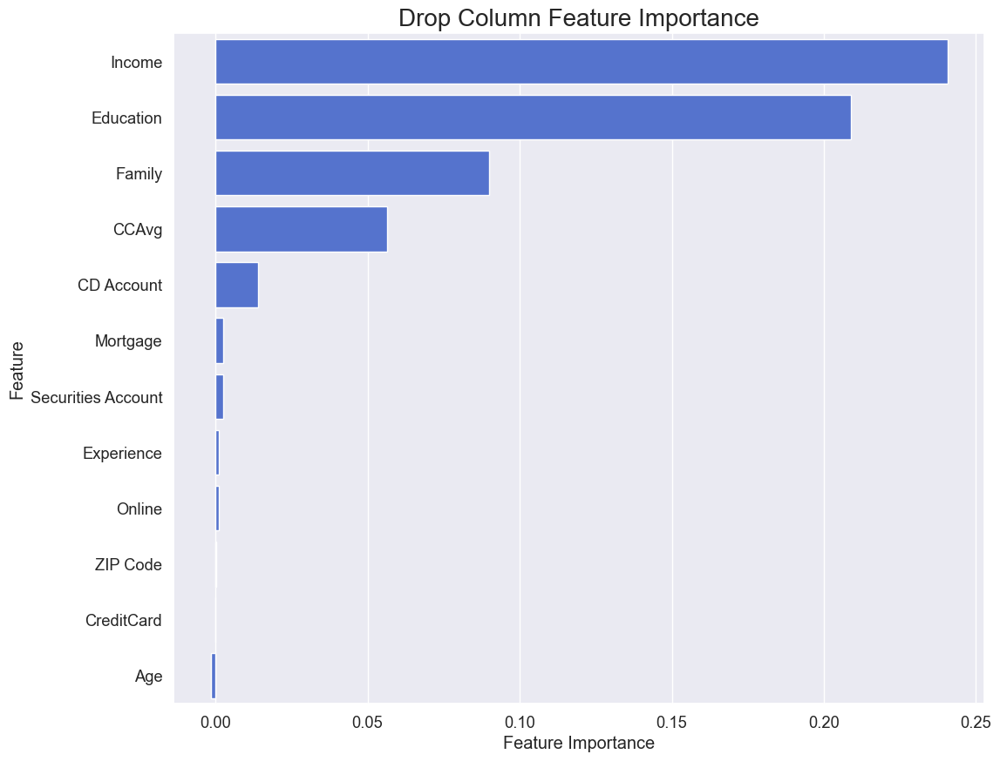

In [109]:
drop_col_importance_plot(dt_opt,X_train,Y_train)

#### Conclusion

- To enhance the performance, we are going to drop "Age" column.

In [110]:
selected_feature = importances_col_dt[importances_col_dt["feature_importances"] >= 0.0]["feature"]

# modifying the X_train and Y_train
X_train_fil=X_train[selected_feature] 
X_test_fil=X_test[selected_feature]

In [111]:
dt1= DecisionTreeClassifier(random_state=0)

In [63]:
dt1_opt=tune_hyperparameter_clf(dt1,param_grid,X_train_fil,Y_train)

Best Parameters 
 {'class_weight': {0: 0.44455555555555554, 1: 0.5554444444444444}, 'criterion': 'entropy', 'max_depth': 6, 'max_features': None, 'min_samples_leaf': 1, 'min_samples_split': 6}


In [64]:
%store dt1_opt

Stored 'dt1_opt' (DecisionTreeClassifier)


In [112]:
%store -r dt1_opt
dt1_opt

DecisionTreeClassifier(class_weight={0: 0.44455555555555554,
                                     1: 0.5554444444444444},
                       criterion='entropy', max_depth=6, min_samples_split=6,
                       random_state=0)

In [113]:
importances_col_dt_mod=drop_col_importance(dt1_opt,X_train_fil,Y_train)

In [114]:
importances_col_dt_mod

,feature,feature_importances
0,Income,0.273845
1,Education,0.210963
2,Family,0.090531
3,CCAvg,0.052948
4,CD Account,0.011491
5,Experience,0.008657
6,Mortgage,0.000000
7,Securities Account,0.000000
8,Online,-0.001590
9,ZIP Code,-0.001590


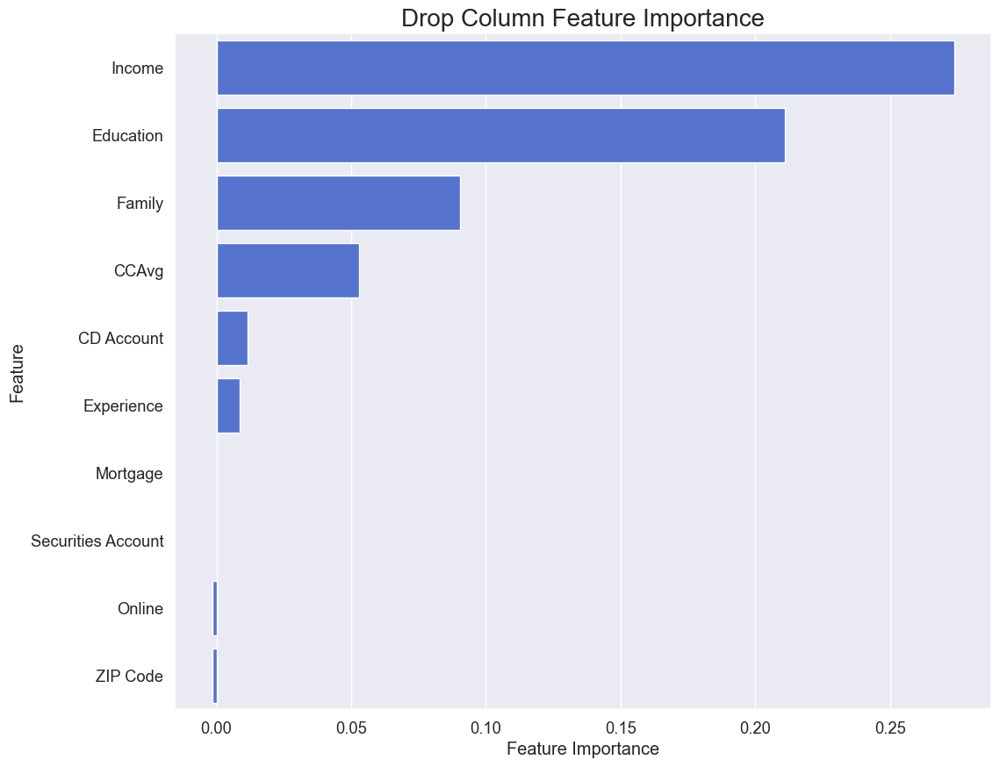

In [115]:
drop_col_importance_plot(dt1_opt,X_train_fil,Y_train)


	  Classification report for training set
-------------------------------------------------------
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      3569
           1       0.94      0.93      0.94       346

    accuracy                           0.99      3915
   macro avg       0.97      0.96      0.97      3915
weighted avg       0.99      0.99      0.99      3915


	   Classification report for test set
-------------------------------------------------------
              precision    recall  f1-score   support

           0       0.99      1.00      0.99       892
           1       0.95      0.91      0.93        87

    accuracy                           0.99       979
   macro avg       0.97      0.95      0.96       979
weighted avg       0.99      0.99      0.99       979



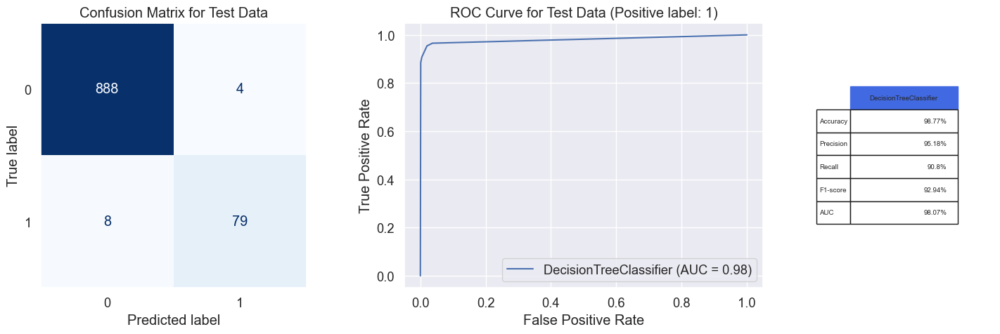

In [116]:
model_evaluation(dt1_opt,X_train_fil,X_test_fil,Y_train,Y_test,"DecisionTreeClassifier")

In [132]:
dt_result=metrics_calculator(dt1_opt,X_test_fil,Y_test,"DecisionTreeClassifier")
dt_result

,DecisionTreeClassifier
Accuracy,98.77%
Precision,95.18%
Recall,90.8%
F1-score,92.94%
AUC,98.07%


<div style="background-color: #00008B; padding: 10px; text-align: center; border-radius: 30px; height: 70px;">
    <h2 style="color: white;">15. Random Forest Model building 
    </h2>
</div>

**Random Forest** is a ensemble learning technique for classification,regression and other task, that operate by constructing
a multitude of decision tree at training time and outputting the class. The trees in a random forest are grown from randomly 
selected samples of the training data and a subset of features. It reduces overfitting and improves its stability by combining
multiple trees and hence the name forest.


**Parameters**
- **n_estimators:** no of decision trees
- **Criteria:** function to measure the quality of split. It includes "gini","entropy","log-loss"
- **max_depth:** maximum depth of tree, can be used to control complexity of model and prevent overfitting
- **min_sample_split:** minimum no of samples required to split an internal node
- **min_sample_leaf:** minimum no of samples required to be at leaf node
- **bootstrap:** Selction is random or not 
- **max_feature:** NO of columns to be used 
- **Class_weight:** Weight of each class 


**Note:** Trees that compose a forest can either be **shallow**, meaning they have a limited number of branches or levels, or **deep**, meaning they have many branches or levels and are not fully grown. **Deep trees** have **low bias** but **high variance** and, so, are relevant choices for **bagging methods** that is mainly focused at **reducing variance**. We consider to have deep trees in choosing the range of values for random forest hyperparameters.



<font color="blue">Hyperparameter tuning</font>



In [53]:
class_weights = [{0:x,1:1.0-x} for x in np.linspace(0.001,1,10)]

param_grid = {'n_estimators':[50,100,150],
             'max_depth':np.arange(5,9),
             'min_samples_split':[1,2,3],
             'min_samples_leaf':[1,2,3],
             "class_weight":class_weights}

In [54]:
rf =RandomForestClassifier(criterion='gini',max_features=None,bootstrap=True,random_state=0)

In [55]:
rf_opt = tune_hyperparameter_clf(rf,param_grid,X_train,Y_train)

Best Parameters 
 {'class_weight': {0: 0.556, 1: 0.44399999999999995}, 'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 3, 'n_estimators': 50}


In [57]:
%store rf_opt

Stored 'rf_opt' (RandomForestClassifier)


In [58]:
%store -r rf_opt

In [59]:
rf_opt

RandomForestClassifier(class_weight={0: 0.556, 1: 0.44399999999999995},
                       max_depth=5, max_features=None, min_samples_split=3,
                       n_estimators=50, random_state=0)

In [60]:
importances_col_rf = drop_col_importance(rf_opt,X_train,Y_train)

In [61]:
importances_col_rf

,feature,feature_importances
0,Income,0.247663
1,Education,0.222793
2,Family,0.087656
3,CCAvg,0.034764
4,CD Account,0.006082
5,ZIP Code,0.002826
6,Securities Account,0.000000
7,Online,0.000000
8,CreditCard,0.000000
9,Experience,-0.001367


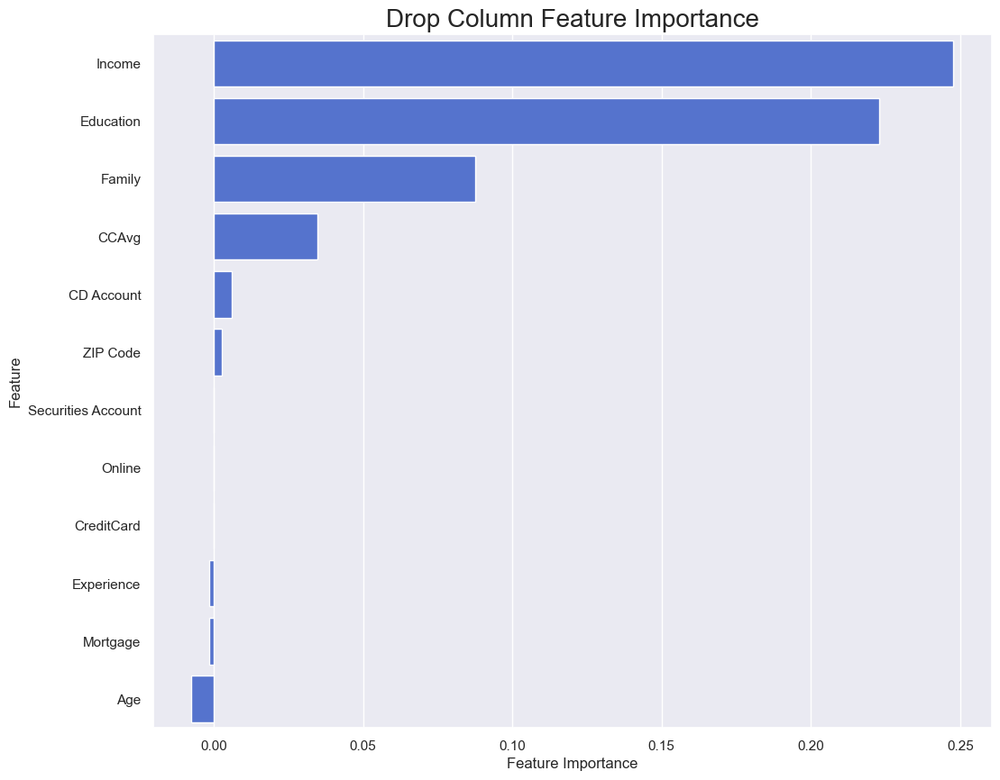

In [62]:
drop_col_importance_plot(rf_opt,X_train,Y_train)

In [64]:
selected_feature = importances_col_rf[importances_col_rf["feature_importances"]>=0]["feature"]

X_train_rf = X_train[selected_feature]
X_test_rf = X_test[selected_feature]

In [68]:
rf_opt_mod = tune_hyperparameter_clf(rf,param_grid,X_train_rf,Y_train)

Best Parameters 
 {'class_weight': {0: 0.667, 1: 0.33299999999999996}, 'max_depth': 8, 'min_samples_leaf': 2, 'min_samples_split': 1, 'n_estimators': 50}


In [69]:
%store rf_opt_mod

Stored 'rf_opt_mod' (RandomForestClassifier)


In [70]:
%store -r rf_opt_mod
rf_opt_mod

RandomForestClassifier(class_weight={0: 0.667, 1: 0.33299999999999996},
                       max_depth=8, max_features=None, min_samples_leaf=2,
                       min_samples_split=1, n_estimators=50, random_state=0)

In [71]:
importances_col_rf = drop_col_importance(rf_opt_mod,X_train_rf,Y_train)
importances_col_rf

,feature,feature_importances
0,Income,0.245470
1,Education,0.210962
2,Family,0.080969
3,CCAvg,0.031922
4,CD Account,0.009863
5,ZIP Code,0.006383
6,CreditCard,0.002001
7,Online,0.001694
8,Securities Account,-0.001505



	  Classification report for training set
-------------------------------------------------------
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      3569
           1       1.00      0.93      0.96       346

    accuracy                           0.99      3915
   macro avg       1.00      0.96      0.98      3915
weighted avg       0.99      0.99      0.99      3915


	   Classification report for test set
-------------------------------------------------------
              precision    recall  f1-score   support

           0       0.99      1.00      0.99       892
           1       0.95      0.87      0.91        87

    accuracy                           0.98       979
   macro avg       0.97      0.93      0.95       979
weighted avg       0.98      0.98      0.98       979



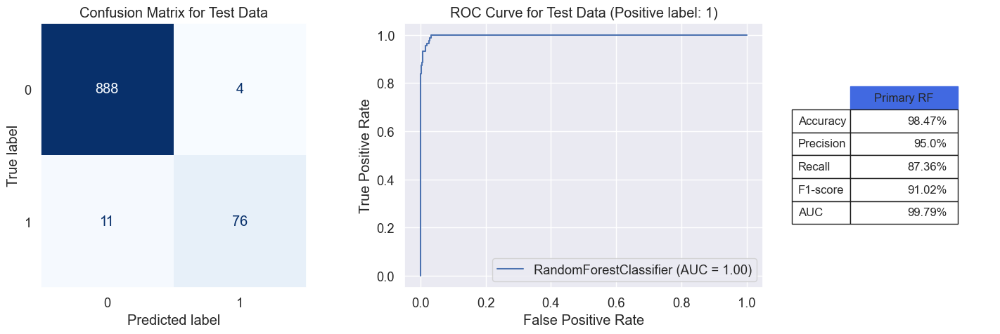

In [103]:
model_evaluation(rf_opt_mod,X_train_rf,X_test_rf,Y_train,Y_test,'Primary RF')

In [74]:
rf_result = metrics_calculator(rf_opt_mod,X_test_rf,Y_test,"Primary RF")
rf_result

,Primary RF
Accuracy,98.47%
Precision,95.0%
Recall,87.36%
F1-score,91.02%
AUC,99.79%


**How do each of these random forest classifier hyperparameter increases model variance ??** 

- **n_estimators:** Incresing the number of trees in forest will increse variance, as more trees in the forest can capture more
    diverse pattern in the data.
- **max_depth:** Increasing the maximum depth of tree allow the tree to capture more complex pattern in the data increasing 
   variance.
- **min_sample_split:** Decreasing the minimum number of samples required to split an internal node will increase the variance
    as it allows for more splits to occur.
- **min_sample_leaf:** Decreasing the minimum number of samples required to be at a leaf node will increase the variance as it
   allows for smaller leaves to form.
- **bootstrap:** Sampling with replacement when building the trees in the forest will increase the variance as it allows for 
   more diverse sets of samples to be used for each tree.
- **max_feature:** Increasing the maximum number of features to consider when splitting a node will increase the variance as it
   allows for more diverse sets of features to be considered when splitting. 

<div style="background-color:pink; padding: 10px; text-align: center; border-radius: 10px; height: 70px;">
    <h2 style="color: white;"> Ensemble Learning 
    </h2>
</div>

**Ensemble Learning** is a machine learning technique that combines the prediction of multiple models to make more accurate
and robust prediction. The idea behind ensemble learning is combining different to solve same problem, the resulting 
ensemble model can perform better than any individual model.

**There are 3 main ensemble learning method:**

**Bagging:**
- stands for bootstrap aggregation
- multiple instances of same base model are trained in parallel on different bootstraped sample of data , the result are
  aggregated through an averaging operation
- Bagging is best suited for model with low bias and high variance, as averaging operation reduces the variance.

**Boosting**
- iterative technique where multiple instances of same base model are trained sequentially
- At each iteration, the current weak learner is trained based on the previous weak learners and how well they performed
  on the data
- Boosting is best suited for model with high bias but low variance, iterative strategy reduces the bias

**Stacking**
- technique where different base model are trained independently, and a meta model is trained on top of that to predict 
  output based on the outputs of base model 
- base model are used as a feature for meta model, which makes final prediction based on the combined information 
  from all the model. 
  
**Important boosting models are:**

**1. AdaBoost:** train a series of weak decision trees and assign more weight to misclassified samples in each iteration

**2. Gradient Boosting:** uses gradient descent optimization algorithm to minimize the loss function and find the best 
  combination of weak models.
 
**3. XGBoost:** extreme gradient boosting , known for its fast training speed ,scalability and ability to handle large 
  datasets

<div style="background-color: #00008B; padding: 10px; text-align: center; border-radius: 30px; height: 70px;">
    <h2 style="color: white;"> 16. AdaBoost classifier
    </h2>
</div>


**Adaptive Boosting (AdaBoost)** is a popular ensemble learning algorithm that is used for classification and regression
. It combines multiple weak classifiers to create a strong classifier that makes accurate predictions. The weak classifiers are trained one by one and the algorithm adjusts the weights of the training instances based on their misclassification rates. The idea behind AdaBoost is to focus on the samples that are misclassified by the previous weak classifiers, so that the subsequent weak classifiers can do a better job in classifying those samples. In this way, the algorithm tries to improve the overall accuracy of the classifier by combining the outputs of multiple weak classifiers.

The term "weak classifier" refers to a simple classifier that is not highly accurate, but when combined with other weak classifiers, results in a strong overall classifier. Typically, decision trees are used as the weak classifiers in AdaBoost. However, any machine learning algorithm that accepts weights on the training data can be used as the base learner in AdaBoost.

**AdaBoost Hyperparameter tuning**

- **Learning rate:** This parameter determines the contribution of each weak learner in the final prediction. A lower 
  learning rate results in a slower convergence, but a more accurate prediction.
- **No. of estimator:** This is the maximum no. of weak learner that will be used to create the final classifier. A larger 
  no. of estimator can lead to more accurate prediction, but it also increases the computation time.
- **estimator:** The algorithm used for the weak learner can be selected based on the problem at hand, we chose decision 
   tree
   
<font color="blue"> Hyperparameter grid for adaboost</font>

In [117]:
ada_param_grid ={ "algorithm":['SAMME','SAMME.R'],
                 "n_estimators":[30,40,45,50,100,150],
                 "learning_rate":[0.7,0.6,0.8,0.9,1]
}

In [118]:
dt_ada=DecisionTreeClassifier(criterion="gini",max_features=None,random_state =0)
ada= AdaBoostClassifier(base_estimator=dt_ada,random_state=0)

In [119]:
ada_opt = tune_hyperparameter_clf(ada,ada_param_grid,X_train,Y_train)

Best Parameters 
 {'algorithm': 'SAMME', 'learning_rate': 0.7, 'n_estimators': 30}


In [120]:
%store ada_opt

Stored 'ada_opt' (AdaBoostClassifier)


In [121]:
%store -r ada_opt
ada_opt

AdaBoostClassifier(algorithm='SAMME',
                   base_estimator=DecisionTreeClassifier(random_state=0),
                   learning_rate=0.7, n_estimators=30, random_state=0)

In [122]:
importance_col_ada=drop_col_importance(ada_opt,X_train,Y_train)
importance_col_ada

,feature,feature_importances
0,Income,0.224986
1,Education,0.213074
2,Family,0.120298
3,CCAvg,0.042225
4,Age,0.006667
5,Securities Account,0.005708
6,Mortgage,0.002918
7,CreditCard,0.002718
8,Online,0.001552
9,Experience,-0.000602


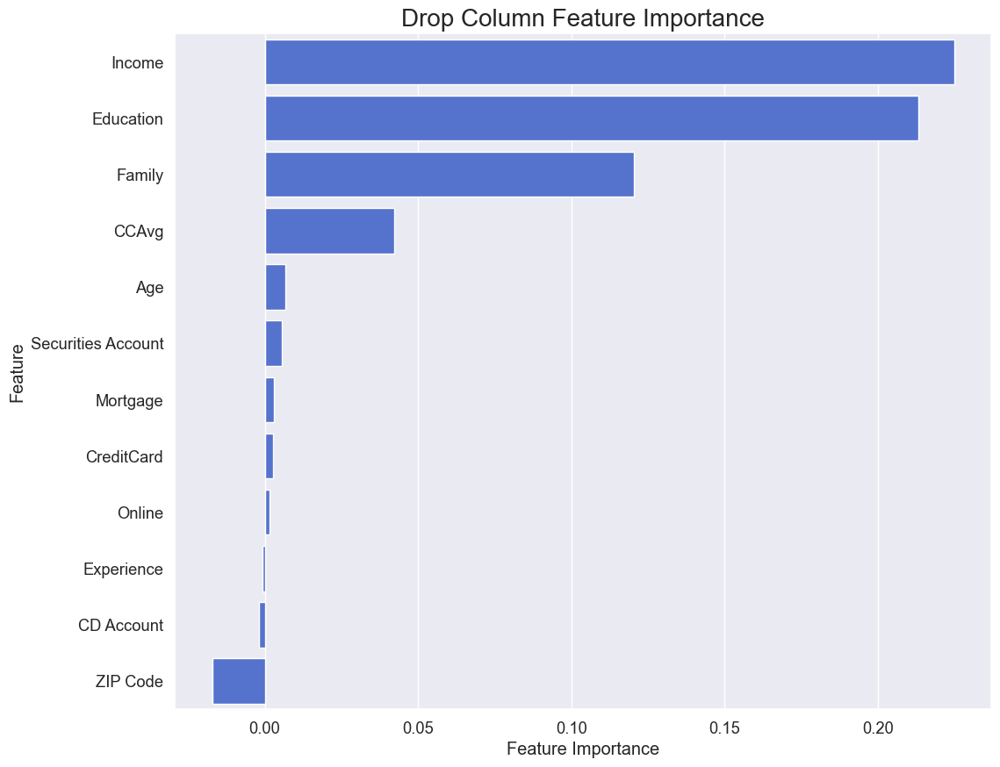

In [123]:
drop_col_importance_plot(ada_opt,X_train,Y_train)

### Conclusion

- ZIP Code , CD Account and Experience shows negative column importance

In [124]:
selected_features = importance_col_ada[importance_col_ada['feature_importances']>=0]['feature']

X_train_ada=X_train[selected_features]
X_test_ada=X_test[selected_features]

In [125]:
selected_features

0                Income
1             Education
2                Family
3                 CCAvg
4                   Age
5    Securities Account
6              Mortgage
7            CreditCard
8                Online
Name: feature, dtype: object

In [126]:
ada1= AdaBoostClassifier(base_estimator=dt_ada,random_state=0)
ada_opt_mod =tune_hyperparameter_clf(ada1,ada_param_grid,X_train_ada,Y_train)

Best Parameters 
 {'algorithm': 'SAMME', 'learning_rate': 0.7, 'n_estimators': 30}


In [127]:
importance_col_ada_mod = drop_col_importance(ada_opt_mod,X_train_ada,Y_train,random_state=0)
importance_col_ada_mod

,feature,feature_importances
0,Education,0.207800
1,Income,0.192018
2,Family,0.149671
3,CCAvg,0.048471
4,Age,0.018030
5,Online,0.004956
6,Securities Account,-0.001427
7,CreditCard,-0.001996
8,Mortgage,-0.004219



	  Classification report for training set
-------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3569
           1       1.00      1.00      1.00       346

    accuracy                           1.00      3915
   macro avg       1.00      1.00      1.00      3915
weighted avg       1.00      1.00      1.00      3915


	   Classification report for test set
-------------------------------------------------------
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       892
           1       0.90      0.93      0.92        87

    accuracy                           0.98       979
   macro avg       0.95      0.96      0.95       979
weighted avg       0.98      0.98      0.98       979



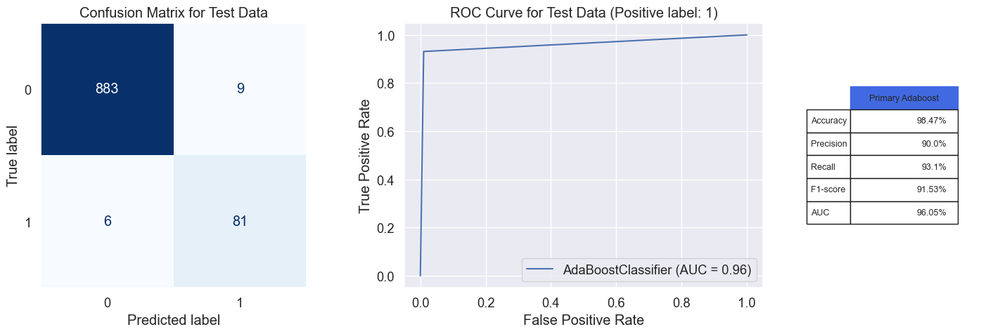

In [128]:
model_evaluation(ada_opt_mod,X_train_ada,X_test_ada,Y_train,Y_test,'Primary Adaboost')

In [129]:
ada_result=metrics_calculator(ada_opt_mod,X_test_ada,Y_test,"Primary Adaboost")
ada_result

,Primary Adaboost
Accuracy,98.47%
Precision,90.0%
Recall,93.1%
F1-score,91.53%
AUC,96.05%


In [134]:
rf_result,dt_result,ada_result

(          Primary RF
 Accuracy      98.47%
 Precision      95.0%
 Recall        87.36%
 F1-score      91.02%
 AUC           99.79%,
           DecisionTreeClassifier
 Accuracy                  98.77%
 Precision                 95.18%
 Recall                     90.8%
 F1-score                  92.94%
 AUC                       98.07%,
           Primary Adaboost
 Accuracy            98.47%
 Precision            90.0%
 Recall               93.1%
 F1-score            91.53%
 AUC                 96.05%)

#### Conclusion 

- Even after removing the columns we are not getting the better results than decision tree, so we are optimising decision tree which is the base model in adaboost

In [ ]:

DecisionTreeClassifier
DecisionTreeClassifier(class_weight={0: 0.44455555555555554,
                                     1: 0.5554444444444444},
                       criterion='entropy', max_depth=6, min_samples_split=6,
                       random_state=0)


DecisionTreeClassifier
DecisionTreeClassifier(class_weight={0: 0.5, 1: 0.5}, criterion='entropy',
                       max_depth=6, min_samples_leaf=2, min_samples_split=1,
                       random_state=0)

In [140]:
ada_dt = DecisionTreeClassifier(criterion='entropy',max_features=None,max_depth=6,min_samples_leaf=2,
                                min_samples_split=6,random_state=0)

ada_final =AdaBoostClassifier(base_estimator=ada_dt,random_state=0,n_estimators=50,algorithm=
                             "SAMME",learning_rate=0.7)
ada_final.fit(X_train,Y_train)

AdaBoostClassifier(algorithm='SAMME',
                   base_estimator=DecisionTreeClassifier(criterion='entropy',
                                                         max_depth=6,
                                                         min_samples_leaf=2,
                                                         min_samples_split=6,
                                                         random_state=0),
                   learning_rate=0.7, random_state=0)


	  Classification report for training set
-------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3569
           1       1.00      1.00      1.00       346

    accuracy                           1.00      3915
   macro avg       1.00      1.00      1.00      3915
weighted avg       1.00      1.00      1.00      3915


	   Classification report for test set
-------------------------------------------------------
              precision    recall  f1-score   support

           0       0.99      1.00      1.00       892
           1       0.99      0.92      0.95        87

    accuracy                           0.99       979
   macro avg       0.99      0.96      0.97       979
weighted avg       0.99      0.99      0.99       979



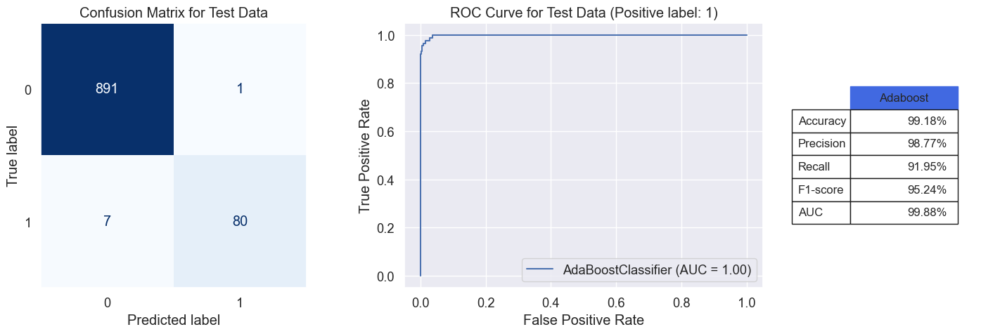

In [141]:
model_evaluation(ada_final,X_train,X_test,Y_train,Y_test,"Adaboost")

In [144]:
ada_final_result=metrics_calculator(ada_final,X_test,Y_test,'Adaboost')
ada_final_result

,Adaboost
Accuracy,99.18%
Precision,98.77%
Recall,91.95%
F1-score,95.24%
AUC,99.88%


#### Conclusion

- The variance of the model is reduced and thus the performance of the model on the test data is improved 
- The F1 score obtained is greater than the previous models.

In [20]:
# Concatenate previous classifiers perfermance results into a single dataframe
results = pd.concat([lr_result, dt_result,
           rf_result,  ada_final_result], axis=1).T

# Sort the dataframe in descending order based on F1-score values
results.sort_values(by='F1-score', ascending=False, inplace=True)

# Color the F1-score column
results.style.applymap(lambda x: 'background-color: tab20', subset='F1-score')

,Accuracy,Precision,Recall,F1-score,AUC
Adaboost,99.18%,98.77%,91.95%,95.24%,99.88%
DecisionTreeClassifier,98.77%,95.18%,90.8%,92.94%,98.07%
Primary RF,98.47%,95.0%,87.36%,91.02%,99.79
Logistic Regression,94.28%,72.46%,57.47%,64.1%,95.74%


### <font color='blue'>Conclusion</font>

- OUt of all the classifier Adaboost perform the best